Pull News Headlines from Guadian via Guardian API

In [2]:
import pandas as pd
import json
import requests
from os import makedirs
from os.path import join, exists
from datetime import date, timedelta

ARTICLES_DIR = join('tempdata', 'articles')
makedirs(ARTICLES_DIR, exist_ok=True)
# Sample URL
#
# http://content.guardianapis.com/search?from-date=2016-01-02&
# to-date=2016-01-02&order-by=newest&show-fields=all&page-size=200
# &api-key=your-api-key-goes-here

MY_API_KEY = '7b19c1dd-bbb2-4e16-bdba-a24bae43df92'
API_ENDPOINT = 'http://content.guardianapis.com/search'
my_params = {
    'from-date': "",
    'to-date': "",
    'order-by': "newest",
    'show-fields': 'all',
    'page-size': 200,
    'api-key': MY_API_KEY
}


# day iteration from here:
# http://stackoverflow.com/questions/7274267/print-all-day-dates-between-two-dates
start_date = date(2012, 3, 1)
end_date = date(2012,3, 30)
dayrange = range((end_date - start_date).days + 1)
news_data = []
for daycount in dayrange:
    dt = start_date + timedelta(days=daycount)
    datestr = dt.strftime('%Y-%m-%d')
    fname = join(ARTICLES_DIR, datestr + '.json')
    if not exists(fname):
        # then let's download it
        print("Downloading", datestr)
        all_results = []
        my_params['from-date'] = datestr
        my_params['to-date'] = datestr
        current_page = 1
        total_pages = 1
        while current_page <= total_pages:
            print("...page", current_page)
            my_params['page'] = current_page
            resp = requests.get(API_ENDPOINT, my_params)
            data = resp.json()
            all_results.extend(data['response']['results'])
            
            # if there is more than one page
            current_page += 1
            total_pages = data['response']['pages']
            news_data.extend(all_results)
        #Writes .json file for each day of news headlines
        #with open(fname, 'w') as f:
        #    print("Writing to", fname)

            # re-serialize it for pretty indentation
        #    f.write(json.dumps(all_results, indent=2))

...page 1
...page 2
...page 3
...page 1
...page 2
...page 3
...page 1
...page 1
...page 2
...page 1
...page 2
...page 1
...page 2
...page 3
...page 1
...page 2
...page 1
...page 2
...page 1
...page 2
...page 3
...page 1
...page 1
...page 2
...page 1
...page 2
...page 1
...page 2
...page 1
...page 2
...page 3
...page 1
...page 2
...page 3
...page 1
...page 2
...page 3
...page 1
...page 1
...page 2
...page 1
...page 2
...page 1
...page 2
...page 1
...page 2
...page 1
...page 2
...page 1
...page 2
...page 3
...page 1
...page 1
...page 2
...page 1
...page 2
...page 1
...page 2
...page 1
...page 2
...page 1
...page 2
...page 1
...page 2
...page 3


Checking the resulting string of data

In [134]:
news_data

[{'id': 'commentisfree/2012/mar/01/bryons-maiden-speech',
  'type': 'article',
  'sectionId': 'commentisfree',
  'sectionName': 'Opinion',
  'webPublicationDate': '2012-03-01T23:38:32Z',
  'webTitle': "In praise of… Byron's maiden speech | Editorial",
  'webUrl': 'https://www.theguardian.com/commentisfree/2012/mar/01/bryons-maiden-speech',
  'apiUrl': 'https://content.guardianapis.com/commentisfree/2012/mar/01/bryons-maiden-speech',
  'fields': {'headline': "In praise of… Byron's maiden speech",
   'standfirst': "It is not just Lord Byron's poems that still ring down the ages",
   'trailText': "<strong>Editorial:</strong> It is not just Lord Byron's poems that still ring down the ages",
   'byline': 'Editorial',
   'main': '',
   'body': '<p>Even after 200 years, Lord Byron\'s <a href="http://lordbyron.org/monograph.php?doc=RoDalla.1824&amp;&amp;select=Chap8" title="">maiden speech in the House of Lords</a> has a searing effect. Delivered two centuries ago this week, in response to pla

Convert results from dictionary to data frame

In [3]:
results_df = pd.DataFrame.from_records(news_data)
results_df = results_df.drop(columns=['isHosted','pillarId','apiUrl'])
#results_df.iloc[116] 
fields_df = pd.DataFrame.from_records(results_df['fields'])
results_df['body'] = fields_df['body']
results_df

,id,type,sectionId,sectionName,webPublicationDate,webTitle,webUrl,fields,pillarName,body
0,commentisfree/2012/mar/01/bryons-maiden-speech,article,commentisfree,Opinion,2012-03-01T23:38:32Z,In praise of… Byron's maiden speech | Editorial,https://www.theguardian.com/commentisfree/2012...,{'headline': 'In praise of… Byron's maiden spe...,Opinion,"<p>Even after 200 years, Lord Byron's <a href=..."
1,world/iran-blog/2012/mar/01/iran-israel-us-nat...,article,world,World news,2012-03-01T23:34:12Z,Washington expects Tehran to hit at US targets...,https://www.theguardian.com/world/iran-blog/20...,{'headline': 'Washington expects Tehran to hit...,News,<p>Whether or not the US is directly party to ...
2,music/2012/mar/01/robert-glasper-black-radio-r...,article,music,Music,2012-03-01T23:30:00Z,Robert Glasper Experiment: Black Radio – review,https://www.theguardian.com/music/2012/mar/01/...,{'headline': 'Robert Glasper Experiment: Black...,Arts,"<p>With his 2009 album Double Booked, pianist ..."
3,commentisfree/2012/mar/01/wales-drumbeat-devol...,article,commentisfree,Opinion,2012-03-01T23:27:59Z,Wales: drumbeat of devolution | Editorial,https://www.theguardian.com/commentisfree/2012...,"{'headline': 'Wales: drumbeat of devolution', ...",Opinion,<p>Do not take Wales for granted. That is the ...
4,fashion/2012/mar/01/paris-fashion-week-balenciaga,article,fashion,Fashion,2012-03-01T23:26:35Z,Paris fashion week: Balenciaga gets down to bu...,https://www.theguardian.com/fashion/2012/mar/0...,{'headline': 'Paris fashion week: Balenciaga g...,Lifestyle,"<figure class=""element element-image"" data-med..."
...,...,...,...,...,...,...,...,...,...,...
19305,travel/2012/mar/30/easter-activities-family-uk,article,travel,Travel,2012-03-30T04:30:00Z,Easter days out in Britain,https://www.theguardian.com/travel/2012/mar/30...,"{'headline': 'Easter days out in Britain', 'st...",Lifestyle,"<h2>Alice in Wonderland Trail, Brodsworth Hall..."
19306,world/2012/mar/30/trayvon-martin-witness-zimme...,article,us-news,US news,2012-03-30T02:31:00Z,Trayvon Martin killing: witness says he saw Zi...,https://www.theguardian.com/world/2012/mar/30/...,{'headline': 'Trayvon Martin killing: witness ...,News,<p>A man who says he saw Trayvon Martin shot d...
19307,politics/2012/mar/30/george-galloway-bradford-...,article,politics,Politics,2012-03-30T01:53:58Z,George Galloway wins Bradford West byelection,https://www.theguardian.com/politics/2012/mar/...,{'headline': 'George Galloway wins Bradford We...,News,"<p>George Galloway, the leading figure in Resp..."
19308,world/gallery/2012/mar/30/spain-barcelona-gene...,gallery,world,World news,2012-03-30T01:06:00Z,Barcelona strike – in pictures,https://www.theguardian.com/world/gallery/2012...,"{'headline': 'Barcelona strike – in pictures',...",News,"<figure class=""element element-image"" data-med..."


Identify the unique news categories

In [137]:
categories = results_df['sectionName'].unique()
categories

array(['Opinion', 'World news', 'Music', 'Fashion', 'US news', 'UK news',
       'Technology', 'Football', 'Sport', 'Media', 'Politics', 'Film',
       'Television & radio', 'Business', 'Society', 'Games',
       'Environment', 'Life and style', 'Culture', 'Stage', 'Travel',
       'Money', 'Books', 'Art and design', 'Voluntary Sector Network',
       'Guardian Sustainable Business', 'News', 'Science', 'Law',
       'Global development', 'Guardian Government Computing', 'Education',
       'Global', "Children's books", 'Public Leaders Network', 'Activate',
       'Culture professionals network', 'Food', 'Guardian Careers',
       'Crosswords', 'Housing Network', 'Local Leaders Network',
       'Social Care Network', 'Media Network', 'From the Guardian',
       'Healthcare Professionals Network', 'Inequality', 'Extra',
       'Teacher Network', 'Australia news', 'Info',
       'Changing Media Summit 2015',
       'Global Development Professionals Network',
       'Student Media awards 2

Select Relevant News Categories

In [4]:
categories = ['Money', 'Culture','Nanotechnology world', 'World news', 'US news',
       'Global','Technology','News', 'Society', 'Politics', 'Business', 'Environment',
       'UK news', 'From the Guardian', 'Inequality', 'Science',
       'Guardian Sustainable Business', 'Law', 'Housing Network', 'Education', 'Global development']

Filter Results by Relevant Categories

In [5]:
results_df['pillarName'].unique()

array(['Opinion', 'News', 'Arts', 'Lifestyle', 'Sport', nan], dtype=object)

In [6]:
filter_pillars_df = results_df[(results_df['pillarName']=='News') & (results_df['type']=='article')]

In [7]:
filter_categories_df = filter_pillars_df[filter_pillars_df['sectionName'].isin(categories)]
del filter_categories_df['fields']
filter_categories_df = filter_categories_df.drop_duplicates()
filter_categories_df = filter_categories_df.reset_index()
del filter_categories_df['index']
filter_categories_df

,id,type,sectionId,sectionName,webPublicationDate,webTitle,webUrl,pillarName,body
0,world/iran-blog/2012/mar/01/iran-israel-us-nat...,article,world,World news,2012-03-01T23:34:12Z,Washington expects Tehran to hit at US targets...,https://www.theguardian.com/world/iran-blog/20...,News,<p>Whether or not the US is directly party to ...
1,world/us-news-blog/2012/mar/01/forgery-sheriff...,article,us-news,US news,2012-03-01T23:20:00Z,Forgery most foul! Sheriff Joe Arpaio's birthe...,https://www.theguardian.com/world/us-news-blog...,News,<p>It's hard work being a conspiracy theorist....
2,uk/2012/mar/01/shooting-belfast-man-wounded,article,uk-news,UK news,2012-03-01T23:16:51Z,Man shot dead in Belfast,https://www.theguardian.com/uk/2012/mar/01/sho...,News,<p>A west Belfast man has been shot dead in wh...
3,technology/gamesblog/2012/mar/01/assassins-cre...,article,technology,Technology,2012-03-01T23:11:37Z,Assassin's Creed III announced,https://www.theguardian.com/technology/gamesbl...,News,<p>Ubisoft has announced the first details of ...
4,world/2012/mar/01/istanbul-city-urban-renewal,article,world,World news,2012-03-01T23:00:00Z,Istanbul sees history razed in the name of reg...,https://www.theguardian.com/world/2012/mar/01/...,News,<p>A few hundred metres from the bustling Taks...
...,...,...,...,...,...,...,...,...,...
3517,uk/the-northerner/2012/mar/30/manchester-chari...,article,uk-news,UK news,2012-03-30T06:30:00Z,Helping asylum seekers win university places,https://www.theguardian.com/uk/the-northerner/...,News,<p>Universities are being persuaded to waive t...
3518,environment/2012/mar/30/birds-eye-sustainable-...,article,environment,Environment,2012-03-30T05:30:02Z,Birds Eye fish fingers get thumbs up from sust...,https://www.theguardian.com/environment/2012/m...,News,<p>Ecological awareness is coming to the capta...
3519,world/2012/mar/30/trayvon-martin-witness-zimme...,article,us-news,US news,2012-03-30T02:31:00Z,Trayvon Martin killing: witness says he saw Zi...,https://www.theguardian.com/world/2012/mar/30/...,News,<p>A man who says he saw Trayvon Martin shot d...
3520,politics/2012/mar/30/george-galloway-bradford-...,article,politics,Politics,2012-03-30T01:53:58Z,George Galloway wins Bradford West byelection,https://www.theguardian.com/politics/2012/mar/...,News,"<p>George Galloway, the leading figure in Resp..."


Perform Sentiment Analysis on Headlines

In [8]:
import nltk
nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer as SIA

sia = SIA()
headline_sentiment = []
web_titles = filter_categories_df['webTitle'].tolist()
for title in web_titles:
  pol_score = sia.polarity_scores(title)
  pol_score['headline'] = title
  headline_sentiment.append(pol_score)
headline_sentiment
headline_sentiment_df = pd.DataFrame.from_records(headline_sentiment)
headline_sentiment_df

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


,neg,neu,pos,compound,headline
0,0.209,0.791,0.000,-0.4404,Washington expects Tehran to hit at US targets...
1,0.000,1.000,0.000,0.0000,Forgery most foul! Sheriff Joe Arpaio's birthe...
2,0.518,0.482,0.000,-0.6486,Man shot dead in Belfast
3,0.000,1.000,0.000,0.0000,Assassin's Creed III announced
4,0.000,1.000,0.000,0.0000,Istanbul sees history razed in the name of reg...
...,...,...,...,...,...
3517,0.000,0.400,0.600,0.7184,Helping asylum seekers win university places
3518,0.000,1.000,0.000,0.0000,Birds Eye fish fingers get thumbs up from sust...
3519,0.306,0.694,0.000,-0.6597,Trayvon Martin killing: witness says he saw Zi...
3520,0.000,0.575,0.425,0.5719,George Galloway wins Bradford West byelection


Perform Sentiment Analysis on Body of Article

In [9]:
import re
CLEANR = re.compile('<.*?>')
body_sentiment = []
bodies = filter_categories_df['body'].tolist()
for body in bodies:
  #removes HTML tages from text
  body = re.sub(CLEANR, '', body)
  body_pol_score = sia.polarity_scores(body)
  body_pol_score['body'] = body
  body_sentiment.append(body_pol_score)
headline_sentiment
body_sentiment_df = pd.DataFrame.from_records(body_sentiment)
body_sentiment_df

,neg,neu,pos,compound,body
0,0.142,0.793,0.066,-0.9845,Whether or not the US is directly party to an ...
1,0.080,0.862,0.058,-0.9501,It's hard work being a conspiracy theorist. Ju...
2,0.231,0.751,0.018,-0.9974,A west Belfast man has been shot dead in what ...
3,0.043,0.891,0.066,0.5106,Ubisoft has announced the first details of for...
4,0.115,0.820,0.065,-0.9925,A few hundred metres from the bustling Taksim ...
...,...,...,...,...,...
3517,0.012,0.876,0.112,0.9917,Universities are being persuaded to waive thei...
3518,0.000,0.899,0.101,0.9809,Ecological awareness is coming to the captain'...
3519,0.136,0.803,0.060,-0.9958,A man who says he saw Trayvon Martin shot dead...
3520,0.063,0.834,0.103,0.9941,"George Galloway, the leading figure in Respect..."


Add news sentiment results to the data frame

In [10]:
filter_categories_df['Headline Sentiment'] = headline_sentiment_df['compound']
filter_categories_df['Body Sentiment'] = body_sentiment_df['compound']
filter_categories_df

,id,type,sectionId,sectionName,webPublicationDate,webTitle,webUrl,pillarName,body,Headline Sentiment,Body Sentiment
0,world/iran-blog/2012/mar/01/iran-israel-us-nat...,article,world,World news,2012-03-01T23:34:12Z,Washington expects Tehran to hit at US targets...,https://www.theguardian.com/world/iran-blog/20...,News,<p>Whether or not the US is directly party to ...,-0.4404,-0.9845
1,world/us-news-blog/2012/mar/01/forgery-sheriff...,article,us-news,US news,2012-03-01T23:20:00Z,Forgery most foul! Sheriff Joe Arpaio's birthe...,https://www.theguardian.com/world/us-news-blog...,News,<p>It's hard work being a conspiracy theorist....,0.0000,-0.9501
2,uk/2012/mar/01/shooting-belfast-man-wounded,article,uk-news,UK news,2012-03-01T23:16:51Z,Man shot dead in Belfast,https://www.theguardian.com/uk/2012/mar/01/sho...,News,<p>A west Belfast man has been shot dead in wh...,-0.6486,-0.9974
3,technology/gamesblog/2012/mar/01/assassins-cre...,article,technology,Technology,2012-03-01T23:11:37Z,Assassin's Creed III announced,https://www.theguardian.com/technology/gamesbl...,News,<p>Ubisoft has announced the first details of ...,0.0000,0.5106
4,world/2012/mar/01/istanbul-city-urban-renewal,article,world,World news,2012-03-01T23:00:00Z,Istanbul sees history razed in the name of reg...,https://www.theguardian.com/world/2012/mar/01/...,News,<p>A few hundred metres from the bustling Taks...,0.0000,-0.9925
...,...,...,...,...,...,...,...,...,...,...,...
3517,uk/the-northerner/2012/mar/30/manchester-chari...,article,uk-news,UK news,2012-03-30T06:30:00Z,Helping asylum seekers win university places,https://www.theguardian.com/uk/the-northerner/...,News,<p>Universities are being persuaded to waive t...,0.7184,0.9917
3518,environment/2012/mar/30/birds-eye-sustainable-...,article,environment,Environment,2012-03-30T05:30:02Z,Birds Eye fish fingers get thumbs up from sust...,https://www.theguardian.com/environment/2012/m...,News,<p>Ecological awareness is coming to the capta...,0.0000,0.9809
3519,world/2012/mar/30/trayvon-martin-witness-zimme...,article,us-news,US news,2012-03-30T02:31:00Z,Trayvon Martin killing: witness says he saw Zi...,https://www.theguardian.com/world/2012/mar/30/...,News,<p>A man who says he saw Trayvon Martin shot d...,-0.6597,-0.9958
3520,politics/2012/mar/30/george-galloway-bradford-...,article,politics,Politics,2012-03-30T01:53:58Z,George Galloway wins Bradford West byelection,https://www.theguardian.com/politics/2012/mar/...,News,"<p>George Galloway, the leading figure in Resp...",0.5719,0.9941


In [145]:
filter_categories_df.shape[0]

3522

Converting date text to datetime format

In [11]:
for index, rows in filter_categories_df.iterrows():
  stripped_date = filter_categories_df['webPublicationDate'].iloc[index]
  stripped_date = stripped_date[:len(stripped_date)-10]
  filter_categories_df['webPublicationDate'].iloc[index] = stripped_date
filter_categories_df

<ipython-input-11-db806b122691>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filter_categories_df['webPublicationDate'].iloc[index] = stripped_date


,id,type,sectionId,sectionName,webPublicationDate,webTitle,webUrl,pillarName,body,Headline Sentiment,Body Sentiment
0,world/iran-blog/2012/mar/01/iran-israel-us-nat...,article,world,World news,2012-03-01,Washington expects Tehran to hit at US targets...,https://www.theguardian.com/world/iran-blog/20...,News,<p>Whether or not the US is directly party to ...,-0.4404,-0.9845
1,world/us-news-blog/2012/mar/01/forgery-sheriff...,article,us-news,US news,2012-03-01,Forgery most foul! Sheriff Joe Arpaio's birthe...,https://www.theguardian.com/world/us-news-blog...,News,<p>It's hard work being a conspiracy theorist....,0.0000,-0.9501
2,uk/2012/mar/01/shooting-belfast-man-wounded,article,uk-news,UK news,2012-03-01,Man shot dead in Belfast,https://www.theguardian.com/uk/2012/mar/01/sho...,News,<p>A west Belfast man has been shot dead in wh...,-0.6486,-0.9974
3,technology/gamesblog/2012/mar/01/assassins-cre...,article,technology,Technology,2012-03-01,Assassin's Creed III announced,https://www.theguardian.com/technology/gamesbl...,News,<p>Ubisoft has announced the first details of ...,0.0000,0.5106
4,world/2012/mar/01/istanbul-city-urban-renewal,article,world,World news,2012-03-01,Istanbul sees history razed in the name of reg...,https://www.theguardian.com/world/2012/mar/01/...,News,<p>A few hundred metres from the bustling Taks...,0.0000,-0.9925
...,...,...,...,...,...,...,...,...,...,...,...
3517,uk/the-northerner/2012/mar/30/manchester-chari...,article,uk-news,UK news,2012-03-30,Helping asylum seekers win university places,https://www.theguardian.com/uk/the-northerner/...,News,<p>Universities are being persuaded to waive t...,0.7184,0.9917
3518,environment/2012/mar/30/birds-eye-sustainable-...,article,environment,Environment,2012-03-30,Birds Eye fish fingers get thumbs up from sust...,https://www.theguardian.com/environment/2012/m...,News,<p>Ecological awareness is coming to the capta...,0.0000,0.9809
3519,world/2012/mar/30/trayvon-martin-witness-zimme...,article,us-news,US news,2012-03-30,Trayvon Martin killing: witness says he saw Zi...,https://www.theguardian.com/world/2012/mar/30/...,News,<p>A man who says he saw Trayvon Martin shot d...,-0.6597,-0.9958
3520,politics/2012/mar/30/george-galloway-bradford-...,article,politics,Politics,2012-03-30,George Galloway wins Bradford West byelection,https://www.theguardian.com/politics/2012/mar/...,News,"<p>George Galloway, the leading figure in Resp...",0.5719,0.9941


Setting date as dataframe index

In [16]:
filter_categories_df.set_index('webPublicationDate')
#filter_categories_df.index = pd.to_datetime(filter_categories_df)

,id,type,sectionId,sectionName,webTitle,webUrl,pillarName,body,Headline Sentiment,Body Sentiment
webPublicationDate,,,,,,,,,,
2012-03-01,world/iran-blog/2012/mar/01/iran-israel-us-nat...,article,world,World news,Washington expects Tehran to hit at US targets...,https://www.theguardian.com/world/iran-blog/20...,News,<p>Whether or not the US is directly party to ...,-0.4404,-0.9845
2012-03-01,world/us-news-blog/2012/mar/01/forgery-sheriff...,article,us-news,US news,Forgery most foul! Sheriff Joe Arpaio's birthe...,https://www.theguardian.com/world/us-news-blog...,News,<p>It's hard work being a conspiracy theorist....,0.0000,-0.9501
2012-03-01,uk/2012/mar/01/shooting-belfast-man-wounded,article,uk-news,UK news,Man shot dead in Belfast,https://www.theguardian.com/uk/2012/mar/01/sho...,News,<p>A west Belfast man has been shot dead in wh...,-0.6486,-0.9974
2012-03-01,technology/gamesblog/2012/mar/01/assassins-cre...,article,technology,Technology,Assassin's Creed III announced,https://www.theguardian.com/technology/gamesbl...,News,<p>Ubisoft has announced the first details of ...,0.0000,0.5106
2012-03-01,world/2012/mar/01/istanbul-city-urban-renewal,article,world,World news,Istanbul sees history razed in the name of reg...,https://www.theguardian.com/world/2012/mar/01/...,News,<p>A few hundred metres from the bustling Taks...,0.0000,-0.9925
...,...,...,...,...,...,...,...,...,...,...
2012-03-30,uk/the-northerner/2012/mar/30/manchester-chari...,article,uk-news,UK news,Helping asylum seekers win university places,https://www.theguardian.com/uk/the-northerner/...,News,<p>Universities are being persuaded to waive t...,0.7184,0.9917
2012-03-30,environment/2012/mar/30/birds-eye-sustainable-...,article,environment,Environment,Birds Eye fish fingers get thumbs up from sust...,https://www.theguardian.com/environment/2012/m...,News,<p>Ecological awareness is coming to the capta...,0.0000,0.9809
2012-03-30,world/2012/mar/30/trayvon-martin-witness-zimme...,article,us-news,US news,Trayvon Martin killing: witness says he saw Zi...,https://www.theguardian.com/world/2012/mar/30/...,News,<p>A man who says he saw Trayvon Martin shot d...,-0.6597,-0.9958


Setting date to correct format

In [43]:
filter_categories_df['webPublicationDate'] = pd.to_datetime(filter_categories_df['webPublicationDate'], format='%Y-%m-%d')
filter_categories_df.dtypes


id                            object
type                          object
sectionId                     object
sectionName                   object
webPublicationDate    datetime64[ns]
webTitle                      object
webUrl                        object
pillarName                    object
body                          object
Headline Sentiment           float64
Body Sentiment               float64
dtype: object

Sorting body text of news headlines by date

In [69]:
import statistics as stat
means = []
for date in dayrange:
  news_date = start_date + timedelta(days=date)
  filtered_date = filter_categories_df[filter_categories_df['webPublicationDate'] == news_date.strftime('%Y-%m-%d')]
  mean = stat.mean(filtered_date['Body Sentiment'])
  means.append(mean)

Plotting the mean sentiment over the date range

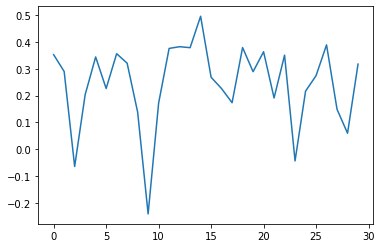

In [68]:
import matplotlib.pyplot as plt
#filter_categories_df['webPublicationDate'] = pd.to_datetime(filter_categories_df['webPublicationDae'])
#filter_indx = filter_categories_df.reset_index()
zoom = filter_categories_df['Headline Sentiment'][:250]
#plt.scatter(x = filter_categories_df['webPublicationDate'], y=filter_categories_df['Body Sentiment'])
plt.plot(means)
plt.show()